# GANomaly
- 2020.08.16 : gen 1 / lr 1e-2

# 개발일지
- 2020.08.15 : 분율 추출 구현 / 이상치 상관계수 추출 구현 / 모델 save, load 구현
- 2020.08.16 : anomaly detect 이미지 저장 구현 / 티타늄(Ti64) 상대 밀도 계산 구현

--- 

# Module

In [1]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torchvision.utils import save_image
import os
import numpy as np

import torchvision.datasets as dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils

# Graph & Animation
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Hyper Parameter

In [2]:
latent_size = 100  # z벡터의 잠재공간(latent space)의 크기
workers = 4    # 0일때, 약 20% 사용 4일 경우 메모리 100%
img_size = 64
channel = 1
epochs = 100
batch_size = 64
learning_rate = 1e-2

# Data and Device

In [3]:
# 이미지 경로, 이미지들 리사이즈 및 텐서형태로 만들기
#data_root = "../../dataset/train"
CFRP_aug_data_root = "../../dataset/aug_train/aug_CFRP"

data_set = dataset.ImageFolder(root = CFRP_aug_data_root, # data_root,
                           transform = transforms.Compose([
                                  #transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

print("size of dataset :", len(data_set))

# 배치로 나누고 셔플하기
data_loader = torch.utils.data.DataLoader(data_set, batch_size = batch_size,
                                         shuffle = True, num_workers = workers, drop_last=True)

# Device setting (GPU or CPU)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print("device :", device)

size of dataset : 1368
device : cuda:0


# MODEL

In [4]:
# GANomaly : Generative Adversarial Networks Model using Decoder with AutoEncoder

# === Decoder 모델 ===
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        
        # Batch Normalization 유무에 따른 G_block 정의
        def DC_conv_block(in_features, out_features):
            block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
            ]
            return block
        
        def DC_deconv_block(in_features, out_features, FIRST=True):
            if FIRST:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 1, 0, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 2, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            return block
        
        
        # ======================= 픽셀 분포 생성 layer ======================= 
        self.DC_gen_distribution = nn.Sequential(
            # ------ input is latent_size 100 ------ 
            *DC_deconv_block(latent_size, img_size*8, FIRST=True),
            # ------ state size is 512x4x4 ------ 
            *DC_conv_block(img_size*8, img_size*8),
            # ------ state size is 512x4x4 ------   
            *DC_deconv_block(img_size*8, img_size*4, FIRST=False),
            # ------ state size is 256x8x8 ------ 
            *DC_conv_block(img_size*4, img_size*4),
            # ------ state size is 256x8x8 ------ 
            *DC_deconv_block(img_size*4, img_size*2, FIRST=False),
            # ------ state size is 128x16x16 ------ 
            *DC_conv_block(img_size*2, img_size*2),
            # ------ state size is 128x16x16 ------ 
            *DC_deconv_block(img_size*2, img_size, FIRST=False),
        )
        
        # =================== 가짜 이미지 생성 layer =================== 
        self.DC_gen_fake_img = nn.Sequential(
            # ------ state size is 64x32x32 ------ 
            nn.ConvTranspose2d(img_size, 1, 4, 2, 1, bias=False),
            nn.Tanh() # 픽셀값의 범위 : -1 ~ 1로 두기 위해서
            # ------ state size is 1x64x64 ------ 
        )
    
    def forward(self, input):
        distribution = self.DC_gen_distribution(input)
        fake_img = self.DC_gen_fake_img(distribution)
        
        return fake_img


# === Discriminator 모델 ===
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        # Batch Normalization 유무에 따른 D_block 정의
        def D_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 layer ==============
        self.D_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *D_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *D_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *D_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *D_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *D_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *D_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *D_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *D_block(img_size*8, img_size*8, MP=True),
        )
        
        # ===================== 이진 분류 layer =====================
        self.D_classification = nn.Sequential(        
            # ------- state size 512x4x4 ------- 
            nn.Conv2d(img_size*8, channel, 4, 1, 0, bias=False),
            #nn.Linear(fms*8*4*4, 1, bias=False),
            nn.Sigmoid()        
        )
        
    def forward(self, input):
        feature = self.D_extract_feature(input)
        classification = self.D_classification(feature)
        
        return classification, feature 


# === Encoder Model ===
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        
        def EC_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 ==============
        self.EC_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *EC_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *EC_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *EC_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *EC_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *EC_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *EC_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *EC_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *EC_block(img_size*8, img_size*8, MP=True),
        )
        
        # =============== Encoder Training layer ===============
        self.EC_validate = nn.Sequential(
            # -------state is 512 x 4 x 4-------
            nn.Conv2d(img_size*8, latent_size, 4, 1, 0, bias=False),
            nn.Tanh()
            # -------state is 100 x 97 x 97-------
        )
        
    def forward(self, input):
        feature = self.EC_extract_feature(input)
        validity = self.EC_validate(feature)
        
        return validity

# Loss & Optim

In [5]:
# DC and D 무게 초기화, classname 에 찾는 name가 없다면 -1 ,
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# D,DC,EC 네트워크 모델 객체 선언
D = Discriminator().to(device)
DC = Decoder().to(device)
EC = Encoder().to(device)

# weight initialize/ nn.Module 클래스 안에 apply 함수가 정의되 있음, 각 함수들에 다 적용 하게한다
D.apply(weights_init)
DC.apply(weights_init)
EC.apply(weights_init)

# Binary cross entropy loss and optimizer
DCGAN_criterion = nn.BCELoss()
AE_criterion = nn.MSELoss()

# latent vector에 배치 사이즈 64를 적용
# 학습한 DC로 새로운 것 만들어서 결과 확인 할때 사용
noise_z = torch.randn(img_size, latent_size, 1, 1, device = device)

# D와 DC에 대해 두가지 최적화 설정
D_optimizer = torch.optim.Adam(D.parameters(), lr = learning_rate, betas=(0.5,0.999))
DC_optimizer = torch.optim.Adam(DC.parameters(), lr = learning_rate, betas=(0.5,0.999))
EC_optimizer = torch.optim.Adam(EC.parameters(), lr = learning_rate, betas=(0.5,0.999))

#print(D)
#print(DC)
#print(EC)

def reset_grad():
    D_optimizer.zero_grad()
    DC_optimizer.zero_grad()

---

# Train DCGAN

In [6]:
img_list = []
DC_losses = []
D_losses = []
iters = 0

def train_DCGAN(epoch, learning_DC_per_D = 4):
    global epochs
    global iters
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        # Train D
        real_img = data[0].to(device) # image size: 64x1x64x64(batch, channel, width, height)
        b_size = real_img.size(0) # b_size = 64
        real_labels = torch.ones(b_size, 1).to(device)
        fake_labels = torch.zeros(b_size, 1).to(device)
        
        # (--------------------------real-----------------------------)
        real_classification, _ = D(real_img) # output = D(x)
        real_loss = DCGAN_criterion(real_classification, real_labels) # D(x)=1일 때의 loss
        real_score = real_classification
        D_x = real_score.mean().item() 
            
        # (--------------------------fake-----------------------------)
        z = torch.randn(b_size, latent_size, 1, 1).to(device) # z size :64x100x1x1
        fake_img = DC(z)
        fake_classification, _ = D(fake_img) # output = D(DC(z))
        fake_loss = DCGAN_criterion(fake_classification, fake_labels) # D(DC(z))=0일 때의 loss
        fake_score = fake_classification
        D_DC_z1 = fake_score.mean().item()

        # (------------------Backprop and optimize---------------------)
        D_loss = real_loss + fake_loss
        reset_grad()
        D_loss.backward()
        D_optimizer.step() # D(x)=1, D(DC(z))=0이어야 D가 최적

        
        # Train DC
        #z = torch.randn(b_size,latent_size,1,1,device=device) # z size :64x100x1x1
        for k in range(learning_DC_per_D):
            fake_img = DC(z)
            fake_classification,_ = D(fake_img)  # output : D(DC(z))
            D_DC_z2 = fake_classification.mean().item()
            DC_loss = DCGAN_criterion(fake_classification, real_labels) # D(DC(z))=1일 때의 loss=log(D(DC(z)))

            # (------------------Backprop and optimize---------------------)
            reset_grad()
            DC_loss.backward()
            DC_optimizer.step() # D(DC(z))=1 이어야 DC가 최적
            # ==> D(DC(z))의 값이 0.5로 수렴해야 한다.
        
        
        # print
        print('[%d/%d][%d/%d]\n- D_loss : %.4f / DC_loss : %.4f\n- D(x):%.4f / D(DC(z1)) : %.4f / D(DC(z2)) : %.4f' 
                   %(epoch+1, epochs, i, len(data_loader),D_loss.item(),
                     DC_loss.item(),D_x,D_DC_z1,D_DC_z2))
        
        # Save Losses for plotting later
        DC_losses.append(DC_loss.item())
        D_losses.append(D_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(noise_z).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [7]:
for epoch in range(epochs):
    train_DCGAN(epoch, learning_DC_per_D = 1)

/home/piai/anaconda3/envs/pytorch/lib/python3.6/site-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([64, 1])) that is different to the input size (torch.Size([64, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


[1/100][0/21]
- D_loss : 1.3739 / DC_loss : 1.1702
- D(x):0.4997 / D(DC(z1)) : 0.4934 / D(DC(z2)) : 0.3183
[1/100][1/21]
- D_loss : 1.1504 / DC_loss : 0.1806
- D(x):0.5622 / D(DC(z1)) : 0.4173 / D(DC(z2)) : 0.8372
[1/100][2/21]
- D_loss : 2.8430 / DC_loss : 1.9674
- D(x):0.8133 / D(DC(z1)) : 0.9141 / D(DC(z2)) : 0.1511
[1/100][3/21]
- D_loss : 0.9740 / DC_loss : 1.2516
- D(x):0.4760 / D(DC(z1)) : 0.1684 / D(DC(z2)) : 0.3099
[1/100][4/21]
- D_loss : 1.1693 / DC_loss : 1.6019
- D(x):0.7291 / D(DC(z1)) : 0.5392 / D(DC(z2)) : 0.2262
[1/100][5/21]
- D_loss : 1.0341 / DC_loss : 2.1007
- D(x):0.6366 / D(DC(z1)) : 0.4187 / D(DC(z2)) : 0.1611
[1/100][6/21]
- D_loss : 2.6318 / DC_loss : 1.5483
- D(x):0.6349 / D(DC(z1)) : 0.8808 / D(DC(z2)) : 0.2128
[1/100][7/21]
- D_loss : 1.8453 / DC_loss : 0.9751
- D(x):0.2302 / D(DC(z1)) : 0.2746 / D(DC(z2)) : 0.3772
[1/100][8/21]
- D_loss : 1.4707 / DC_loss : 0.6901
- D(x):0.3807 / D(DC(z1)) : 0.3949 / D(DC(z2)) : 0.5018
[1/100][9/21]
- D_loss : 1.4202 / DC_

[4/100][14/21]
- D_loss : 1.1051 / DC_loss : 1.2485
- D(x):0.5482 / D(DC(z1)) : 0.3775 / D(DC(z2)) : 0.3369
[4/100][15/21]
- D_loss : 1.4232 / DC_loss : 1.0351
- D(x):0.5797 / D(DC(z1)) : 0.5581 / D(DC(z2)) : 0.3791
[4/100][16/21]
- D_loss : 1.5281 / DC_loss : 1.1277
- D(x):0.4489 / D(DC(z1)) : 0.4685 / D(DC(z2)) : 0.3700
[4/100][17/21]
- D_loss : 1.4047 / DC_loss : 0.8835
- D(x):0.5156 / D(DC(z1)) : 0.4826 / D(DC(z2)) : 0.4589
[4/100][18/21]
- D_loss : 1.5849 / DC_loss : 0.7334
- D(x):0.5207 / D(DC(z1)) : 0.5353 / D(DC(z2)) : 0.4977
[4/100][19/21]
- D_loss : 1.3821 / DC_loss : 0.7556
- D(x):0.5189 / D(DC(z1)) : 0.4949 / D(DC(z2)) : 0.4752
[4/100][20/21]
- D_loss : 1.3076 / DC_loss : 0.8989
- D(x):0.5421 / D(DC(z1)) : 0.4892 / D(DC(z2)) : 0.4095
[5/100][0/21]
- D_loss : 1.2986 / DC_loss : 0.8731
- D(x):0.4983 / D(DC(z1)) : 0.4480 / D(DC(z2)) : 0.4208
[5/100][1/21]
- D_loss : 1.2677 / DC_loss : 0.7468
- D(x):0.5236 / D(DC(z1)) : 0.4548 / D(DC(z2)) : 0.4772
[5/100][2/21]
- D_loss : 1.300

[8/100][8/21]
- D_loss : 1.6509 / DC_loss : 1.2580
- D(x):0.2355 / D(DC(z1)) : 0.0607 / D(DC(z2)) : 0.3373
[8/100][9/21]
- D_loss : 1.3354 / DC_loss : 1.2877
- D(x):0.6209 / D(DC(z1)) : 0.5212 / D(DC(z2)) : 0.3170
[8/100][10/21]
- D_loss : 1.0206 / DC_loss : 1.8431
- D(x):0.6230 / D(DC(z1)) : 0.3735 / D(DC(z2)) : 0.1984
[8/100][11/21]
- D_loss : 1.1898 / DC_loss : 1.6137
- D(x):0.6606 / D(DC(z1)) : 0.4571 / D(DC(z2)) : 0.3000
[8/100][12/21]
- D_loss : 1.3496 / DC_loss : 1.3436
- D(x):0.5317 / D(DC(z1)) : 0.4107 / D(DC(z2)) : 0.3133
[8/100][13/21]
- D_loss : 1.1214 / DC_loss : 1.7505
- D(x):0.5422 / D(DC(z1)) : 0.3485 / D(DC(z2)) : 0.1914
[8/100][14/21]
- D_loss : 0.8264 / DC_loss : 1.7716
- D(x):0.5884 / D(DC(z1)) : 0.2286 / D(DC(z2)) : 0.2075
[8/100][15/21]
- D_loss : 0.9042 / DC_loss : 1.8078
- D(x):0.7600 / D(DC(z1)) : 0.4040 / D(DC(z2)) : 0.1825
[8/100][16/21]
- D_loss : 0.6832 / DC_loss : 2.6470
- D(x):0.7274 / D(DC(z1)) : 0.2629 / D(DC(z2)) : 0.0847
[8/100][17/21]
- D_loss : 0.64

[12/100][0/21]
- D_loss : 1.5272 / DC_loss : 0.8158
- D(x):0.4052 / D(DC(z1)) : 0.4497 / D(DC(z2)) : 0.4537
[12/100][1/21]
- D_loss : 1.4637 / DC_loss : 1.6482
- D(x):0.6215 / D(DC(z1)) : 0.6056 / D(DC(z2)) : 0.2179
[12/100][2/21]
- D_loss : 1.3174 / DC_loss : 0.9780
- D(x):0.4085 / D(DC(z1)) : 0.3199 / D(DC(z2)) : 0.3965
[12/100][3/21]
- D_loss : 1.3954 / DC_loss : 0.8539
- D(x):0.5687 / D(DC(z1)) : 0.5421 / D(DC(z2)) : 0.4383
[12/100][4/21]
- D_loss : 1.3287 / DC_loss : 1.0499
- D(x):0.5633 / D(DC(z1)) : 0.5128 / D(DC(z2)) : 0.3622
[12/100][5/21]
- D_loss : 1.3293 / DC_loss : 0.8058
- D(x):0.4645 / D(DC(z1)) : 0.4096 / D(DC(z2)) : 0.4581
[12/100][6/21]
- D_loss : 1.2766 / DC_loss : 1.1387
- D(x):0.6235 / D(DC(z1)) : 0.5260 / D(DC(z2)) : 0.3286
[12/100][7/21]
- D_loss : 1.0437 / DC_loss : 1.3542
- D(x):0.5390 / D(DC(z1)) : 0.3384 / D(DC(z2)) : 0.2661
[12/100][8/21]
- D_loss : 0.9602 / DC_loss : 0.7920
- D(x):0.5637 / D(DC(z1)) : 0.3090 / D(DC(z2)) : 0.4578
[12/100][9/21]
- D_loss : 1.

[15/100][14/21]
- D_loss : 0.6625 / DC_loss : 5.6412
- D(x):0.8208 / D(DC(z1)) : 0.3354 / D(DC(z2)) : 0.0175
[15/100][15/21]
- D_loss : 0.2954 / DC_loss : 4.2860
- D(x):0.7814 / D(DC(z1)) : 0.0283 / D(DC(z2)) : 0.0248
[15/100][16/21]
- D_loss : 0.1799 / DC_loss : 5.4032
- D(x):0.9382 / D(DC(z1)) : 0.1022 / D(DC(z2)) : 0.0067
[15/100][17/21]
- D_loss : 0.1238 / DC_loss : 5.2953
- D(x):0.9332 / D(DC(z1)) : 0.0439 / D(DC(z2)) : 0.0110
[15/100][18/21]
- D_loss : 0.0599 / DC_loss : 7.1783
- D(x):0.9500 / D(DC(z1)) : 0.0039 / D(DC(z2)) : 0.0058
[15/100][19/21]
- D_loss : 0.0457 / DC_loss : 7.2311
- D(x):0.9683 / D(DC(z1)) : 0.0117 / D(DC(z2)) : 0.0066
[15/100][20/21]
- D_loss : 0.0318 / DC_loss : 7.4546
- D(x):0.9832 / D(DC(z1)) : 0.0133 / D(DC(z2)) : 0.0043
[16/100][0/21]
- D_loss : 0.0190 / DC_loss : 7.1066
- D(x):0.9910 / D(DC(z1)) : 0.0096 / D(DC(z2)) : 0.0048
[16/100][1/21]
- D_loss : 0.0279 / DC_loss : 6.9612
- D(x):0.9898 / D(DC(z1)) : 0.0168 / D(DC(z2)) : 0.0045
[16/100][2/21]
- D_lo

[19/100][6/21]
- D_loss : 0.1409 / DC_loss : 13.0636
- D(x):0.9357 / D(DC(z1)) : 0.0622 / D(DC(z2)) : 0.0000
[19/100][7/21]
- D_loss : 0.1457 / DC_loss : 5.3055
- D(x):0.8799 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0156
[19/100][8/21]
- D_loss : 0.0429 / DC_loss : 6.6341
- D(x):0.9604 / D(DC(z1)) : 0.0021 / D(DC(z2)) : 0.0142
[19/100][9/21]
- D_loss : 0.1833 / DC_loss : 2.9378
- D(x):0.9788 / D(DC(z1)) : 0.1239 / D(DC(z2)) : 0.0712
[19/100][10/21]
- D_loss : 0.1202 / DC_loss : 4.8973
- D(x):0.9542 / D(DC(z1)) : 0.0652 / D(DC(z2)) : 0.0113
[19/100][11/21]
- D_loss : 0.1399 / DC_loss : 4.7051
- D(x):0.8928 / D(DC(z1)) : 0.0213 / D(DC(z2)) : 0.0114
[19/100][12/21]
- D_loss : 0.1034 / DC_loss : 4.1379
- D(x):0.9240 / D(DC(z1)) : 0.0196 / D(DC(z2)) : 0.0272
[19/100][13/21]
- D_loss : 0.0808 / DC_loss : 4.5649
- D(x):0.9574 / D(DC(z1)) : 0.0352 / D(DC(z2)) : 0.0161
[19/100][14/21]
- D_loss : 0.0402 / DC_loss : 5.2408
- D(x):0.9753 / D(DC(z1)) : 0.0140 / D(DC(z2)) : 0.0072
[19/100][15/21]
- D_lo

[22/100][20/21]
- D_loss : 0.0057 / DC_loss : 8.7281
- D(x):0.9975 / D(DC(z1)) : 0.0031 / D(DC(z2)) : 0.0008
[23/100][0/21]
- D_loss : 0.0041 / DC_loss : 9.1183
- D(x):0.9969 / D(DC(z1)) : 0.0010 / D(DC(z2)) : 0.0003
[23/100][1/21]
- D_loss : 0.0035 / DC_loss : 9.1346
- D(x):0.9972 / D(DC(z1)) : 0.0007 / D(DC(z2)) : 0.0003
[23/100][2/21]
- D_loss : 0.0054 / DC_loss : 8.5327
- D(x):0.9964 / D(DC(z1)) : 0.0018 / D(DC(z2)) : 0.0007
[23/100][3/21]
- D_loss : 0.0030 / DC_loss : 9.4887
- D(x):0.9974 / D(DC(z1)) : 0.0004 / D(DC(z2)) : 0.0002
[23/100][4/21]
- D_loss : 0.0062 / DC_loss : 8.4647
- D(x):0.9963 / D(DC(z1)) : 0.0024 / D(DC(z2)) : 0.0007
[23/100][5/21]
- D_loss : 0.0141 / DC_loss : 10.6147
- D(x):0.9954 / D(DC(z1)) : 0.0079 / D(DC(z2)) : 0.0002
[23/100][6/21]
- D_loss : 0.0049 / DC_loss : 10.1461
- D(x):0.9973 / D(DC(z1)) : 0.0021 / D(DC(z2)) : 0.0004
[23/100][7/21]
- D_loss : 0.0073 / DC_loss : 8.6906
- D(x):0.9948 / D(DC(z1)) : 0.0021 / D(DC(z2)) : 0.0006
[23/100][8/21]
- D_loss :

[26/100][12/21]
- D_loss : 0.2866 / DC_loss : 3.8630
- D(x):0.8085 / D(DC(z1)) : 0.0424 / D(DC(z2)) : 0.0416
[26/100][13/21]
- D_loss : 0.2776 / DC_loss : 3.2762
- D(x):0.8330 / D(DC(z1)) : 0.0719 / D(DC(z2)) : 0.0574
[26/100][14/21]
- D_loss : 0.2506 / DC_loss : 3.5622
- D(x):0.8683 / D(DC(z1)) : 0.0956 / D(DC(z2)) : 0.0451
[26/100][15/21]
- D_loss : 0.0815 / DC_loss : 4.5096
- D(x):0.9762 / D(DC(z1)) : 0.0541 / D(DC(z2)) : 0.0214
[26/100][16/21]
- D_loss : 0.1095 / DC_loss : 4.7733
- D(x):0.9480 / D(DC(z1)) : 0.0508 / D(DC(z2)) : 0.0144
[26/100][17/21]
- D_loss : 0.0489 / DC_loss : 5.1220
- D(x):0.9783 / D(DC(z1)) : 0.0262 / D(DC(z2)) : 0.0102
[26/100][18/21]
- D_loss : 0.0352 / DC_loss : 5.4050
- D(x):0.9796 / D(DC(z1)) : 0.0143 / D(DC(z2)) : 0.0073
[26/100][19/21]
- D_loss : 0.0434 / DC_loss : 5.1984
- D(x):0.9844 / D(DC(z1)) : 0.0270 / D(DC(z2)) : 0.0089
[26/100][20/21]
- D_loss : 0.0648 / DC_loss : 4.9244
- D(x):0.9580 / D(DC(z1)) : 0.0171 / D(DC(z2)) : 0.0108
[27/100][0/21]
- D_

[30/100][4/21]
- D_loss : 0.0021 / DC_loss : 9.7244
- D(x):0.9988 / D(DC(z1)) : 0.0009 / D(DC(z2)) : 0.0002
[30/100][5/21]
- D_loss : 0.0018 / DC_loss : 8.8590
- D(x):0.9992 / D(DC(z1)) : 0.0009 / D(DC(z2)) : 0.0003
[30/100][6/21]
- D_loss : 0.0025 / DC_loss : 11.1807
- D(x):0.9976 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0001
[30/100][7/21]
- D_loss : 0.0066 / DC_loss : 9.4812
- D(x):0.9938 / D(DC(z1)) : 0.0003 / D(DC(z2)) : 0.0002
[30/100][8/21]
- D_loss : 0.0026 / DC_loss : 8.3582
- D(x):0.9983 / D(DC(z1)) : 0.0009 / D(DC(z2)) : 0.0006
[30/100][9/21]
- D_loss : 0.0219 / DC_loss : 12.1177
- D(x):0.9973 / D(DC(z1)) : 0.0151 / D(DC(z2)) : 0.0002
[30/100][10/21]
- D_loss : 0.0070 / DC_loss : 14.2648
- D(x):0.9932 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0000
[30/100][11/21]
- D_loss : 0.0044 / DC_loss : 14.7894
- D(x):0.9956 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[30/100][12/21]
- D_loss : 0.0018 / DC_loss : 14.1584
- D(x):0.9982 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[30/100][13/21]
- D_

[33/100][18/21]
- D_loss : 0.0004 / DC_loss : 15.1705
- D(x):0.9996 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[33/100][19/21]
- D_loss : 0.0014 / DC_loss : 14.2707
- D(x):0.9986 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[33/100][20/21]
- D_loss : 0.0005 / DC_loss : 13.9038
- D(x):0.9995 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0000
[34/100][0/21]
- D_loss : 0.0010 / DC_loss : 14.9314
- D(x):0.9991 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0001
[34/100][1/21]
- D_loss : 0.0007 / DC_loss : 14.7888
- D(x):0.9993 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[34/100][2/21]
- D_loss : 0.0012 / DC_loss : 19.0513
- D(x):0.9988 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[34/100][3/21]
- D_loss : 0.0005 / DC_loss : 15.5425
- D(x):0.9995 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[34/100][4/21]
- D_loss : 0.0004 / DC_loss : 16.6658
- D(x):0.9996 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[34/100][5/21]
- D_loss : 0.0007 / DC_loss : 16.1290
- D(x):0.9994 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0001
[34/100][6/21]
-

[37/100][10/21]
- D_loss : 0.0032 / DC_loss : 13.7644
- D(x):0.9968 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[37/100][11/21]
- D_loss : 0.0070 / DC_loss : 9.9509
- D(x):0.9935 / D(DC(z1)) : 0.0003 / D(DC(z2)) : 0.0001
[37/100][12/21]
- D_loss : 0.0112 / DC_loss : 8.7049
- D(x):0.9963 / D(DC(z1)) : 0.0073 / D(DC(z2)) : 0.0004
[37/100][13/21]
- D_loss : 0.0150 / DC_loss : 10.1511
- D(x):0.9856 / D(DC(z1)) : 0.0003 / D(DC(z2)) : 0.0001
[37/100][14/21]
- D_loss : 0.0084 / DC_loss : 8.9552
- D(x):0.9976 / D(DC(z1)) : 0.0059 / D(DC(z2)) : 0.0002
[37/100][15/21]
- D_loss : 0.0076 / DC_loss : 8.4123
- D(x):0.9960 / D(DC(z1)) : 0.0036 / D(DC(z2)) : 0.0004
[37/100][16/21]
- D_loss : 0.0152 / DC_loss : 10.0202
- D(x):0.9972 / D(DC(z1)) : 0.0121 / D(DC(z2)) : 0.0001
[37/100][17/21]
- D_loss : 0.0159 / DC_loss : 9.7606
- D(x):0.9857 / D(DC(z1)) : 0.0013 / D(DC(z2)) : 0.0001
[37/100][18/21]
- D_loss : 0.0095 / DC_loss : 8.9861
- D(x):0.9917 / D(DC(z1)) : 0.0007 / D(DC(z2)) : 0.0002
[37/100][19/21]


[41/100][2/21]
- D_loss : 2.1064 / DC_loss : 17.5317
- D(x):1.0000 / D(DC(z1)) : 0.5047 / D(DC(z2)) : 0.0000
[41/100][3/21]
- D_loss : 0.0995 / DC_loss : 8.7973
- D(x):0.9838 / D(DC(z1)) : 0.0207 / D(DC(z2)) : 0.1970
[41/100][4/21]
- D_loss : 4.9098 / DC_loss : 49.1201
- D(x):0.8828 / D(DC(z1)) : 0.5366 / D(DC(z2)) : 0.0000
[41/100][5/21]
- D_loss : 9.8152 / DC_loss : 25.1915
- D(x):0.0969 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[41/100][6/21]
- D_loss : 0.0235 / DC_loss : 10.5631
- D(x):0.9827 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0122
[41/100][7/21]
- D_loss : 0.3896 / DC_loss : 11.9778
- D(x):0.9966 / D(DC(z1)) : 0.2083 / D(DC(z2)) : 0.0023
[41/100][8/21]
- D_loss : 0.6186 / DC_loss : 16.3873
- D(x):0.9532 / D(DC(z1)) : 0.1972 / D(DC(z2)) : 0.0000
[41/100][9/21]
- D_loss : 1.6573 / DC_loss : 7.8358
- D(x):0.7267 / D(DC(z1)) : 0.0107 / D(DC(z2)) : 0.0268
[41/100][10/21]
- D_loss : 0.2799 / DC_loss : 7.9396
- D(x):0.9971 / D(DC(z1)) : 0.1597 / D(DC(z2)) : 0.0234
[41/100][11/21]
- D_l

[44/100][16/21]
- D_loss : 0.0001 / DC_loss : 8.8129
- D(x):0.9999 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0011
[44/100][17/21]
- D_loss : 0.0024 / DC_loss : 7.3225
- D(x):1.0000 / D(DC(z1)) : 0.0024 / D(DC(z2)) : 0.0082
[44/100][18/21]
- D_loss : 0.5180 / DC_loss : 28.5732
- D(x):1.0000 / D(DC(z1)) : 0.3125 / D(DC(z2)) : 0.0000
[44/100][19/21]
- D_loss : 0.0030 / DC_loss : 31.1248
- D(x):0.9970 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[44/100][20/21]
- D_loss : 0.0073 / DC_loss : 28.9728
- D(x):0.9927 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[45/100][0/21]
- D_loss : 0.0552 / DC_loss : 27.4960
- D(x):0.9601 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[45/100][1/21]
- D_loss : 0.0024 / DC_loss : 26.2728
- D(x):0.9976 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[45/100][2/21]
- D_loss : 0.0023 / DC_loss : 23.7044
- D(x):0.9977 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[45/100][3/21]
- D_loss : 0.0003 / DC_loss : 21.0474
- D(x):0.9997 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[45/100][4/21]
-

[48/100][8/21]
- D_loss : 0.0058 / DC_loss : 7.3523
- D(x):0.9996 / D(DC(z1)) : 0.0054 / D(DC(z2)) : 0.0018
[48/100][9/21]
- D_loss : 0.0052 / DC_loss : 9.3944
- D(x):0.9953 / D(DC(z1)) : 0.0004 / D(DC(z2)) : 0.0002
[48/100][10/21]
- D_loss : 0.0011 / DC_loss : 8.2864
- D(x):0.9998 / D(DC(z1)) : 0.0009 / D(DC(z2)) : 0.0006
[48/100][11/21]
- D_loss : 0.0062 / DC_loss : 8.4825
- D(x):0.9945 / D(DC(z1)) : 0.0006 / D(DC(z2)) : 0.0005
[48/100][12/21]
- D_loss : 0.0013 / DC_loss : 8.0890
- D(x):0.9999 / D(DC(z1)) : 0.0012 / D(DC(z2)) : 0.0008
[48/100][13/21]
- D_loss : 0.0069 / DC_loss : 7.5553
- D(x):0.9984 / D(DC(z1)) : 0.0052 / D(DC(z2)) : 0.0016
[48/100][14/21]
- D_loss : 0.0036 / DC_loss : 9.9974
- D(x):0.9968 / D(DC(z1)) : 0.0003 / D(DC(z2)) : 0.0002
[48/100][15/21]
- D_loss : 0.0016 / DC_loss : 9.1668
- D(x):0.9988 / D(DC(z1)) : 0.0004 / D(DC(z2)) : 0.0003
[48/100][16/21]
- D_loss : 0.0009 / DC_loss : 9.7087
- D(x):0.9994 / D(DC(z1)) : 0.0003 / D(DC(z2)) : 0.0002
[48/100][17/21]
- D_l

[52/100][0/21]
- D_loss : 0.0034 / DC_loss : 9.9463
- D(x):0.9968 / D(DC(z1)) : 0.0002 / D(DC(z2)) : 0.0002
[52/100][1/21]
- D_loss : 0.0070 / DC_loss : 6.7483
- D(x):0.9952 / D(DC(z1)) : 0.0021 / D(DC(z2)) : 0.0018
[52/100][2/21]
- D_loss : 0.0977 / DC_loss : 9.7585
- D(x):0.9873 / D(DC(z1)) : 0.0747 / D(DC(z2)) : 0.0002
[52/100][3/21]
- D_loss : 0.0016 / DC_loss : 12.4086
- D(x):0.9987 / D(DC(z1)) : 0.0003 / D(DC(z2)) : 0.0000
[52/100][4/21]
- D_loss : 0.0172 / DC_loss : 8.3091
- D(x):0.9965 / D(DC(z1)) : 0.0135 / D(DC(z2)) : 0.0016
[52/100][5/21]
- D_loss : 0.1241 / DC_loss : 12.0480
- D(x):0.9858 / D(DC(z1)) : 0.1000 / D(DC(z2)) : 0.0000
[52/100][6/21]
- D_loss : 0.1037 / DC_loss : 11.9704
- D(x):0.9096 / D(DC(z1)) : 0.0007 / D(DC(z2)) : 0.0001
[52/100][7/21]
- D_loss : 0.0299 / DC_loss : 12.6835
- D(x):0.9717 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0000
[52/100][8/21]
- D_loss : 0.0322 / DC_loss : 10.6021
- D(x):0.9705 / D(DC(z1)) : 0.0002 / D(DC(z2)) : 0.0002
[52/100][9/21]
- D_loss

[55/100][14/21]
- D_loss : 0.0420 / DC_loss : 6.9862
- D(x):0.9839 / D(DC(z1)) : 0.0011 / D(DC(z2)) : 0.0014
[55/100][15/21]
- D_loss : 0.0045 / DC_loss : 7.1043
- D(x):0.9965 / D(DC(z1)) : 0.0009 / D(DC(z2)) : 0.0009
[55/100][16/21]
- D_loss : 0.0069 / DC_loss : 7.4178
- D(x):0.9938 / D(DC(z1)) : 0.0007 / D(DC(z2)) : 0.0007
[55/100][17/21]
- D_loss : 0.0014 / DC_loss : 8.9390
- D(x):0.9988 / D(DC(z1)) : 0.0002 / D(DC(z2)) : 0.0002
[55/100][18/21]
- D_loss : 0.0023 / DC_loss : 9.0426
- D(x):0.9979 / D(DC(z1)) : 0.0002 / D(DC(z2)) : 0.0002
[55/100][19/21]
- D_loss : 0.0014 / DC_loss : 8.6378
- D(x):0.9988 / D(DC(z1)) : 0.0002 / D(DC(z2)) : 0.0002
[55/100][20/21]
- D_loss : 0.0015 / DC_loss : 7.9508
- D(x):0.9990 / D(DC(z1)) : 0.0005 / D(DC(z2)) : 0.0005
[56/100][0/21]
- D_loss : 0.0015 / DC_loss : 8.2688
- D(x):0.9991 / D(DC(z1)) : 0.0006 / D(DC(z2)) : 0.0006
[56/100][1/21]
- D_loss : 0.0032 / DC_loss : 7.4610
- D(x):0.9981 / D(DC(z1)) : 0.0013 / D(DC(z2)) : 0.0011
[56/100][2/21]
- D_lo

[59/100][6/21]
- D_loss : 0.0011 / DC_loss : 7.6958
- D(x):0.9997 / D(DC(z1)) : 0.0007 / D(DC(z2)) : 0.0007
[59/100][7/21]
- D_loss : 0.0006 / DC_loss : 8.6845
- D(x):0.9997 / D(DC(z1)) : 0.0002 / D(DC(z2)) : 0.0002
[59/100][8/21]
- D_loss : 0.0014 / DC_loss : 7.9291
- D(x):0.9993 / D(DC(z1)) : 0.0007 / D(DC(z2)) : 0.0006
[59/100][9/21]
- D_loss : 0.0012 / DC_loss : 8.9544
- D(x):0.9990 / D(DC(z1)) : 0.0002 / D(DC(z2)) : 0.0002
[59/100][10/21]
- D_loss : 0.0010 / DC_loss : 8.0702
- D(x):0.9996 / D(DC(z1)) : 0.0006 / D(DC(z2)) : 0.0006
[59/100][11/21]
- D_loss : 0.0005 / DC_loss : 8.4139
- D(x):0.9998 / D(DC(z1)) : 0.0003 / D(DC(z2)) : 0.0003
[59/100][12/21]
- D_loss : 0.0012 / DC_loss : 8.3027
- D(x):0.9994 / D(DC(z1)) : 0.0007 / D(DC(z2)) : 0.0006
[59/100][13/21]
- D_loss : 0.0030 / DC_loss : 8.0578
- D(x):0.9976 / D(DC(z1)) : 0.0006 / D(DC(z2)) : 0.0005
[59/100][14/21]
- D_loss : 0.0009 / DC_loss : 8.4180
- D(x):0.9996 / D(DC(z1)) : 0.0005 / D(DC(z2)) : 0.0004
[59/100][15/21]
- D_los

[62/100][20/21]
- D_loss : 0.0008 / DC_loss : 11.6851
- D(x):0.9992 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[63/100][0/21]
- D_loss : 0.0012 / DC_loss : 9.4619
- D(x):0.9990 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0001
[63/100][1/21]
- D_loss : 0.0002 / DC_loss : 12.5870
- D(x):0.9998 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[63/100][2/21]
- D_loss : 0.0003 / DC_loss : 12.4906
- D(x):0.9997 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[63/100][3/21]
- D_loss : 0.0003 / DC_loss : 10.6397
- D(x):0.9998 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0001
[63/100][4/21]
- D_loss : 0.0010 / DC_loss : 10.9161
- D(x):0.9990 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[63/100][5/21]
- D_loss : 0.0004 / DC_loss : 10.4787
- D(x):0.9997 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[63/100][6/21]
- D_loss : 0.0014 / DC_loss : 11.6341
- D(x):0.9987 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[63/100][7/21]
- D_loss : 0.0016 / DC_loss : 8.9587
- D(x):0.9999 / D(DC(z1)) : 0.0014 / D(DC(z2)) : 0.0007
[63/100][8/21]
- D_l

[66/100][12/21]
- D_loss : 0.0053 / DC_loss : 9.3084
- D(x):0.9949 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0002
[66/100][13/21]
- D_loss : 0.0025 / DC_loss : 8.1741
- D(x):0.9980 / D(DC(z1)) : 0.0005 / D(DC(z2)) : 0.0006
[66/100][14/21]
- D_loss : 0.0046 / DC_loss : 7.2956
- D(x):0.9982 / D(DC(z1)) : 0.0027 / D(DC(z2)) : 0.0024
[66/100][15/21]
- D_loss : 0.0080 / DC_loss : 7.4153
- D(x):0.9970 / D(DC(z1)) : 0.0049 / D(DC(z2)) : 0.0030
[66/100][16/21]
- D_loss : 0.0123 / DC_loss : 7.4767
- D(x):0.9942 / D(DC(z1)) : 0.0062 / D(DC(z2)) : 0.0026
[66/100][17/21]
- D_loss : 0.0158 / DC_loss : 7.9866
- D(x):0.9884 / D(DC(z1)) : 0.0038 / D(DC(z2)) : 0.0017
[66/100][18/21]
- D_loss : 0.0173 / DC_loss : 7.9997
- D(x):0.9905 / D(DC(z1)) : 0.0075 / D(DC(z2)) : 0.0018
[66/100][19/21]
- D_loss : 0.0057 / DC_loss : 8.6020
- D(x):0.9949 / D(DC(z1)) : 0.0005 / D(DC(z2)) : 0.0003
[66/100][20/21]
- D_loss : 0.0111 / DC_loss : 7.8344
- D(x):0.9930 / D(DC(z1)) : 0.0039 / D(DC(z2)) : 0.0018
[67/100][0/21]
- D_

[70/100][4/21]
- D_loss : 0.0050 / DC_loss : 7.6267
- D(x):0.9992 / D(DC(z1)) : 0.0041 / D(DC(z2)) : 0.0015
[70/100][5/21]
- D_loss : 0.0075 / DC_loss : 7.1468
- D(x):0.9967 / D(DC(z1)) : 0.0041 / D(DC(z2)) : 0.0017
[70/100][6/21]
- D_loss : 0.0059 / DC_loss : 7.9159
- D(x):0.9973 / D(DC(z1)) : 0.0032 / D(DC(z2)) : 0.0014
[70/100][7/21]
- D_loss : 0.0054 / DC_loss : 7.5783
- D(x):0.9974 / D(DC(z1)) : 0.0028 / D(DC(z2)) : 0.0015
[70/100][8/21]
- D_loss : 0.0037 / DC_loss : 7.9743
- D(x):0.9987 / D(DC(z1)) : 0.0024 / D(DC(z2)) : 0.0013
[70/100][9/21]
- D_loss : 0.0024 / DC_loss : 8.2139
- D(x):0.9987 / D(DC(z1)) : 0.0011 / D(DC(z2)) : 0.0008
[70/100][10/21]
- D_loss : 0.0106 / DC_loss : 8.7850
- D(x):0.9989 / D(DC(z1)) : 0.0075 / D(DC(z2)) : 0.0016
[70/100][11/21]
- D_loss : 0.0017 / DC_loss : 8.6044
- D(x):0.9993 / D(DC(z1)) : 0.0009 / D(DC(z2)) : 0.0007
[70/100][12/21]
- D_loss : 0.0094 / DC_loss : 7.9049
- D(x):0.9924 / D(DC(z1)) : 0.0016 / D(DC(z2)) : 0.0011
[70/100][13/21]
- D_loss 

[73/100][18/21]
- D_loss : 0.0002 / DC_loss : 27.0419
- D(x):0.9998 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[73/100][19/21]
- D_loss : 0.0000 / DC_loss : 23.0815
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[73/100][20/21]
- D_loss : 0.0002 / DC_loss : 15.0958
- D(x):0.9999 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0001
[74/100][0/21]
- D_loss : 1.2322 / DC_loss : 14.0727
- D(x):0.9998 / D(DC(z1)) : 0.4170 / D(DC(z2)) : 0.0177
[74/100][1/21]
- D_loss : 0.1343 / DC_loss : 17.4833
- D(x):0.9653 / D(DC(z1)) : 0.0233 / D(DC(z2)) : 0.0003
[74/100][2/21]
- D_loss : 0.2014 / DC_loss : 7.8168
- D(x):0.9284 / D(DC(z1)) : 0.0607 / D(DC(z2)) : 0.0039
[74/100][3/21]
- D_loss : 0.2354 / DC_loss : 3.9134
- D(x):0.8871 / D(DC(z1)) : 0.0713 / D(DC(z2)) : 0.0924
[74/100][4/21]
- D_loss : 0.6108 / DC_loss : 10.0994
- D(x):0.9700 / D(DC(z1)) : 0.2359 / D(DC(z2)) : 0.2733
[74/100][5/21]
- D_loss : 2.6015 / DC_loss : 9.7342
- D(x):0.7941 / D(DC(z1)) : 0.4078 / D(DC(z2)) : 0.3188
[74/100][6/21]
- D_

[77/100][10/21]
- D_loss : 0.0000 / DC_loss : 41.0034
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[77/100][11/21]
- D_loss : 0.0001 / DC_loss : 36.4321
- D(x):0.9999 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[77/100][12/21]
- D_loss : 0.0000 / DC_loss : 36.3257
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[77/100][13/21]
- D_loss : 0.0000 / DC_loss : 33.2184
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[77/100][14/21]
- D_loss : 0.0000 / DC_loss : 32.7898
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[77/100][15/21]
- D_loss : 0.0000 / DC_loss : 32.6645
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[77/100][16/21]
- D_loss : 0.0000 / DC_loss : 33.9400
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[77/100][17/21]
- D_loss : 0.0000 / DC_loss : 32.5352
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[77/100][18/21]
- D_loss : 0.0000 / DC_loss : 30.1650
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[77/100][1

[81/100][2/21]
- D_loss : 0.0006 / DC_loss : 9.1675
- D(x):0.9998 / D(DC(z1)) : 0.0004 / D(DC(z2)) : 0.0003
[81/100][3/21]
- D_loss : 0.0009 / DC_loss : 9.0336
- D(x):0.9993 / D(DC(z1)) : 0.0002 / D(DC(z2)) : 0.0001
[81/100][4/21]
- D_loss : 0.0002 / DC_loss : 10.2979
- D(x):0.9998 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0001
[81/100][5/21]
- D_loss : 0.0002 / DC_loss : 11.1215
- D(x):0.9999 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[81/100][6/21]
- D_loss : 0.0011 / DC_loss : 9.8831
- D(x):0.9991 / D(DC(z1)) : 0.0002 / D(DC(z2)) : 0.0001
[81/100][7/21]
- D_loss : 0.0018 / DC_loss : 9.7280
- D(x):0.9985 / D(DC(z1)) : 0.0002 / D(DC(z2)) : 0.0002
[81/100][8/21]
- D_loss : 0.0001 / DC_loss : 10.3195
- D(x):0.9999 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0001
[81/100][9/21]
- D_loss : 0.0004 / DC_loss : 10.6431
- D(x):0.9997 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0000
[81/100][10/21]
- D_loss : 0.0002 / DC_loss : 9.6758
- D(x):0.9999 / D(DC(z1)) : 0.0001 / D(DC(z2)) : 0.0001
[81/100][11/21]
- D_los

[84/100][14/21]
- D_loss : 0.0001 / DC_loss : 11.2313
- D(x):0.9999 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[84/100][15/21]
- D_loss : 0.0000 / DC_loss : 10.8656
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[84/100][16/21]
- D_loss : 0.0000 / DC_loss : 10.8127
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[84/100][17/21]
- D_loss : 0.0001 / DC_loss : 10.2681
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[84/100][18/21]
- D_loss : 0.0001 / DC_loss : 11.1205
- D(x):0.9999 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[84/100][19/21]
- D_loss : 0.0002 / DC_loss : 10.5805
- D(x):0.9998 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[84/100][20/21]
- D_loss : 0.0002 / DC_loss : 10.6068
- D(x):0.9999 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[85/100][0/21]
- D_loss : 0.0001 / DC_loss : 10.5794
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[85/100][1/21]
- D_loss : 0.0003 / DC_loss : 10.7615
- D(x):0.9998 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[85/100][2/2

[88/100][6/21]
- D_loss : 0.0047 / DC_loss : 6.9983
- D(x):1.0000 / D(DC(z1)) : 0.0047 / D(DC(z2)) : 0.0014
[88/100][7/21]
- D_loss : 0.0247 / DC_loss : 18.8027
- D(x):0.9999 / D(DC(z1)) : 0.0242 / D(DC(z2)) : 0.0000
[88/100][8/21]
- D_loss : 0.0006 / DC_loss : 13.7078
- D(x):0.9997 / D(DC(z1)) : 0.0004 / D(DC(z2)) : 0.0000
[88/100][9/21]
- D_loss : 0.0104 / DC_loss : 11.3296
- D(x):0.9931 / D(DC(z1)) : 0.0030 / D(DC(z2)) : 0.0001
[88/100][10/21]
- D_loss : 0.0178 / DC_loss : 11.4305
- D(x):0.9983 / D(DC(z1)) : 0.0148 / D(DC(z2)) : 0.0002
[88/100][11/21]
- D_loss : 0.0090 / DC_loss : 12.4880
- D(x):0.9978 / D(DC(z1)) : 0.0067 / D(DC(z2)) : 0.0000
[88/100][12/21]
- D_loss : 0.0207 / DC_loss : 28.9594
- D(x):0.9989 / D(DC(z1)) : 0.0191 / D(DC(z2)) : 0.0000
[88/100][13/21]
- D_loss : 0.0023 / DC_loss : 39.0495
- D(x):0.9977 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[88/100][14/21]
- D_loss : 0.1064 / DC_loss : 45.4725
- D(x):0.9509 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[88/100][15/21]

[91/100][18/21]
- D_loss : 0.0001 / DC_loss : 51.1971
- D(x):0.9999 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[91/100][19/21]
- D_loss : 0.0014 / DC_loss : 50.2407
- D(x):0.9986 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[91/100][20/21]
- D_loss : 0.0005 / DC_loss : 49.2819
- D(x):0.9995 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[92/100][0/21]
- D_loss : 0.0001 / DC_loss : 51.0152
- D(x):0.9999 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[92/100][1/21]
- D_loss : 0.0001 / DC_loss : 49.3392
- D(x):0.9999 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[92/100][2/21]
- D_loss : 0.0001 / DC_loss : 48.6201
- D(x):0.9999 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[92/100][3/21]
- D_loss : 0.0014 / DC_loss : 50.1433
- D(x):0.9986 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[92/100][4/21]
- D_loss : 0.0023 / DC_loss : 47.8658
- D(x):0.9978 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[92/100][5/21]
- D_loss : 0.0000 / DC_loss : 48.6304
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[92/100][6/21]
-

[95/100][10/21]
- D_loss : 0.0000 / DC_loss : 48.1633
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[95/100][11/21]
- D_loss : 0.0002 / DC_loss : 48.2372
- D(x):0.9998 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[95/100][12/21]
- D_loss : 0.0000 / DC_loss : 49.0017
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[95/100][13/21]
- D_loss : 0.0000 / DC_loss : 49.3788
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[95/100][14/21]
- D_loss : 0.0002 / DC_loss : 49.5039
- D(x):0.9998 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[95/100][15/21]
- D_loss : 0.0002 / DC_loss : 48.4857
- D(x):0.9998 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[95/100][16/21]
- D_loss : 0.0000 / DC_loss : 50.2021
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[95/100][17/21]
- D_loss : 0.0001 / DC_loss : 48.7961
- D(x):0.9999 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[95/100][18/21]
- D_loss : 0.0000 / DC_loss : 50.1076
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[95/100][1

[99/100][2/21]
- D_loss : 0.0001 / DC_loss : 49.3005
- D(x):0.9999 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[99/100][3/21]
- D_loss : 0.0000 / DC_loss : 47.6526
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[99/100][4/21]
- D_loss : 0.0009 / DC_loss : 49.8556
- D(x):0.9991 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[99/100][5/21]
- D_loss : 0.0001 / DC_loss : 50.3781
- D(x):0.9999 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[99/100][6/21]
- D_loss : 0.0000 / DC_loss : 50.7000
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[99/100][7/21]
- D_loss : 0.0000 / DC_loss : 50.3791
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[99/100][8/21]
- D_loss : 0.0000 / DC_loss : 51.3371
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[99/100][9/21]
- D_loss : 0.0000 / DC_loss : 48.3753
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[99/100][10/21]
- D_loss : 0.0000 / DC_loss : 48.6189
- D(x):1.0000 / D(DC(z1)) : 0.0000 / D(DC(z2)) : 0.0000
[99/100][11/21]
- 

# Animation

In [8]:
def animate_gen_imgs():
    fig = plt.figure(figsize=(8,8))
    plt.axis("off")
    
    ims=[[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
    ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
    HTML(ani.to_jshtml())

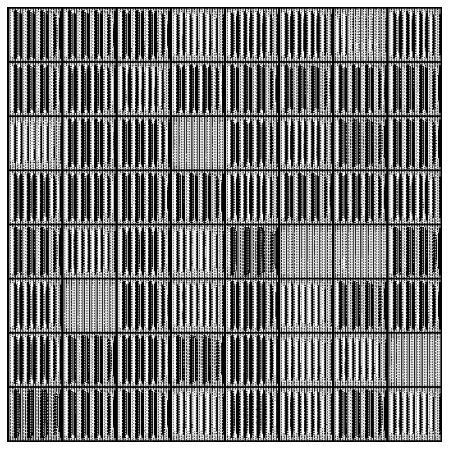

In [9]:
animate_gen_imgs()

# Trian : izif E

In [10]:
DC.eval()
D.eval()

kappa = 1.0
EC_losses = []

iters = 0
AE_img_list = []

def train_AE(epoch):
    global epochs
    global iters
    global EC_losses
    global AE_img_list
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        real_imgs = data[0].to(device)
        
        EC_optimizer.zero_grad()
        
        EC_validity = EC(real_imgs)
        
        fake_imgs = DC(EC_validity)
        
        _, real_features = D.forward(real_imgs)
        _, fake_features = D.forward(fake_imgs)
        
        
        # izif architecture
        imgs_loss = AE_criterion(real_imgs, fake_imgs)
        features_loss = AE_criterion(real_features, fake_features)
        EC_loss = imgs_loss + kappa*features_loss
        
        EC_loss.backward()
        EC_optimizer.step()
        
        # =============================================================
        # print
        # =============================================================
        print('[%d/%d][%d/%d]\n- E_loss: %.4f\n'
              %(epoch+1, epochs, i, len(data_loader), EC_loss.item()))
        
        # Save Losses for plotting later
        EC_losses.append(EC_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(EC_validity).detach().cpu()
            AE_img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [11]:
for epoch in range(epochs):
    train_AE(epoch)

[1/100][0/21]
- E_loss: 1.3486

[1/100][1/21]
- E_loss: 1.2286

[1/100][2/21]
- E_loss: 1.2521

[1/100][3/21]
- E_loss: 1.2943

[1/100][4/21]
- E_loss: 1.3599

[1/100][5/21]
- E_loss: 1.2533

[1/100][6/21]
- E_loss: 1.2627

[1/100][7/21]
- E_loss: 1.2671

[1/100][8/21]
- E_loss: 1.2733

[1/100][9/21]
- E_loss: 1.2730

[1/100][10/21]
- E_loss: 1.2511

[1/100][11/21]
- E_loss: 1.2462

[1/100][12/21]
- E_loss: 1.2802

[1/100][13/21]
- E_loss: 1.2192

[1/100][14/21]
- E_loss: 1.2375

[1/100][15/21]
- E_loss: 1.2656

[1/100][16/21]
- E_loss: 1.2626

[1/100][17/21]
- E_loss: 1.2336

[1/100][18/21]
- E_loss: 1.2558

[1/100][19/21]
- E_loss: 1.2705

[1/100][20/21]
- E_loss: 1.2327

[2/100][0/21]
- E_loss: 1.2385

[2/100][1/21]
- E_loss: 1.2892

[2/100][2/21]
- E_loss: 1.2568

[2/100][3/21]
- E_loss: 1.2517

[2/100][4/21]
- E_loss: 1.2570

[2/100][5/21]
- E_loss: 1.2765

[2/100][6/21]
- E_loss: 1.2618

[2/100][7/21]
- E_loss: 1.2275

[2/100][8/21]
- E_loss: 1.2487

[2/100][9/21]
- E_loss: 1.240

[13/100][0/21]
- E_loss: 1.2520

[13/100][1/21]
- E_loss: 1.2503

[13/100][2/21]
- E_loss: 1.2527

[13/100][3/21]
- E_loss: 1.2279

[13/100][4/21]
- E_loss: 1.2344

[13/100][5/21]
- E_loss: 1.2702

[13/100][6/21]
- E_loss: 1.2318

[13/100][7/21]
- E_loss: 1.2646

[13/100][8/21]
- E_loss: 1.2544

[13/100][9/21]
- E_loss: 1.2807

[13/100][10/21]
- E_loss: 1.2498

[13/100][11/21]
- E_loss: 1.2567

[13/100][12/21]
- E_loss: 1.2783

[13/100][13/21]
- E_loss: 1.2770

[13/100][14/21]
- E_loss: 1.2625

[13/100][15/21]
- E_loss: 1.2751

[13/100][16/21]
- E_loss: 1.2462

[13/100][17/21]
- E_loss: 1.2812

[13/100][18/21]
- E_loss: 1.2354

[13/100][19/21]
- E_loss: 1.2404

[13/100][20/21]
- E_loss: 1.2652

[14/100][0/21]
- E_loss: 1.2603

[14/100][1/21]
- E_loss: 1.2502

[14/100][2/21]
- E_loss: 1.4087

[14/100][3/21]
- E_loss: 1.2801

[14/100][4/21]
- E_loss: 1.2439

[14/100][5/21]
- E_loss: 1.2732

[14/100][6/21]
- E_loss: 1.2650

[14/100][7/21]
- E_loss: 1.2192

[14/100][8/21]
- E_loss: 1.2773


[24/100][15/21]
- E_loss: 1.2417

[24/100][16/21]
- E_loss: 1.2664

[24/100][17/21]
- E_loss: 1.2537

[24/100][18/21]
- E_loss: 1.2434

[24/100][19/21]
- E_loss: 1.2797

[24/100][20/21]
- E_loss: 1.2619

[25/100][0/21]
- E_loss: 1.2648

[25/100][1/21]
- E_loss: 1.2480

[25/100][2/21]
- E_loss: 1.2285

[25/100][3/21]
- E_loss: 1.2842

[25/100][4/21]
- E_loss: 1.2419

[25/100][5/21]
- E_loss: 1.2389

[25/100][6/21]
- E_loss: 1.2572

[25/100][7/21]
- E_loss: 1.2620

[25/100][8/21]
- E_loss: 1.2595

[25/100][9/21]
- E_loss: 1.2516

[25/100][10/21]
- E_loss: 1.2687

[25/100][11/21]
- E_loss: 1.2331

[25/100][12/21]
- E_loss: 1.2264

[25/100][13/21]
- E_loss: 1.2853

[25/100][14/21]
- E_loss: 1.2395

[25/100][15/21]
- E_loss: 1.2543

[25/100][16/21]
- E_loss: 1.2411

[25/100][17/21]
- E_loss: 1.2688

[25/100][18/21]
- E_loss: 1.2447

[25/100][19/21]
- E_loss: 1.2514

[25/100][20/21]
- E_loss: 1.2603

[26/100][0/21]
- E_loss: 1.2597

[26/100][1/21]
- E_loss: 1.2732

[26/100][2/21]
- E_loss: 1

[36/100][9/21]
- E_loss: 1.2341

[36/100][10/21]
- E_loss: 1.2313

[36/100][11/21]
- E_loss: 1.2567

[36/100][12/21]
- E_loss: 1.2610

[36/100][13/21]
- E_loss: 1.2338

[36/100][14/21]
- E_loss: 1.2681

[36/100][15/21]
- E_loss: 1.2414

[36/100][16/21]
- E_loss: 1.2604

[36/100][17/21]
- E_loss: 1.2637

[36/100][18/21]
- E_loss: 1.2645

[36/100][19/21]
- E_loss: 1.2762

[36/100][20/21]
- E_loss: 1.2664

[37/100][0/21]
- E_loss: 1.2834

[37/100][1/21]
- E_loss: 1.2211

[37/100][2/21]
- E_loss: 1.2224

[37/100][3/21]
- E_loss: 1.2452

[37/100][4/21]
- E_loss: 1.2556

[37/100][5/21]
- E_loss: 1.2526

[37/100][6/21]
- E_loss: 1.2518

[37/100][7/21]
- E_loss: 1.2586

[37/100][8/21]
- E_loss: 1.2384

[37/100][9/21]
- E_loss: 1.2209

[37/100][10/21]
- E_loss: 1.2614

[37/100][11/21]
- E_loss: 1.2793

[37/100][12/21]
- E_loss: 1.2430

[37/100][13/21]
- E_loss: 1.2444

[37/100][14/21]
- E_loss: 1.2751

[37/100][15/21]
- E_loss: 1.2331

[37/100][16/21]
- E_loss: 1.2651

[37/100][17/21]
- E_loss:

[48/100][3/21]
- E_loss: 1.2398

[48/100][4/21]
- E_loss: 1.2562

[48/100][5/21]
- E_loss: 1.2584

[48/100][6/21]
- E_loss: 1.2385

[48/100][7/21]
- E_loss: 1.2716

[48/100][8/21]
- E_loss: 1.2400

[48/100][9/21]
- E_loss: 1.2428

[48/100][10/21]
- E_loss: 1.2483

[48/100][11/21]
- E_loss: 1.2481

[48/100][12/21]
- E_loss: 1.2580

[48/100][13/21]
- E_loss: 1.2638

[48/100][14/21]
- E_loss: 1.2553

[48/100][15/21]
- E_loss: 1.2314

[48/100][16/21]
- E_loss: 1.2712

[48/100][17/21]
- E_loss: 1.2567

[48/100][18/21]
- E_loss: 1.2578

[48/100][19/21]
- E_loss: 1.2552

[48/100][20/21]
- E_loss: 1.2672

[49/100][0/21]
- E_loss: 1.2371

[49/100][1/21]
- E_loss: 1.2366

[49/100][2/21]
- E_loss: 1.2648

[49/100][3/21]
- E_loss: 1.2652

[49/100][4/21]
- E_loss: 1.2442

[49/100][5/21]
- E_loss: 1.2479

[49/100][6/21]
- E_loss: 1.2466

[49/100][7/21]
- E_loss: 1.2658

[49/100][8/21]
- E_loss: 1.2481

[49/100][9/21]
- E_loss: 1.2642

[49/100][10/21]
- E_loss: 1.2508

[49/100][11/21]
- E_loss: 1.266

[59/100][18/21]
- E_loss: 1.2522

[59/100][19/21]
- E_loss: 1.2201

[59/100][20/21]
- E_loss: 1.2791

[60/100][0/21]
- E_loss: 1.2455

[60/100][1/21]
- E_loss: 1.2747

[60/100][2/21]
- E_loss: 1.2475

[60/100][3/21]
- E_loss: 1.2602

[60/100][4/21]
- E_loss: 1.2943

[60/100][5/21]
- E_loss: 1.2577

[60/100][6/21]
- E_loss: 1.2492

[60/100][7/21]
- E_loss: 1.2645

[60/100][8/21]
- E_loss: 1.2425

[60/100][9/21]
- E_loss: 1.2674

[60/100][10/21]
- E_loss: 1.2442

[60/100][11/21]
- E_loss: 1.2708

[60/100][12/21]
- E_loss: 1.2494

[60/100][13/21]
- E_loss: 1.2262

[60/100][14/21]
- E_loss: 1.2554

[60/100][15/21]
- E_loss: 1.2429

[60/100][16/21]
- E_loss: 1.2712

[60/100][17/21]
- E_loss: 1.2330

[60/100][18/21]
- E_loss: 1.2436

[60/100][19/21]
- E_loss: 1.2355

[60/100][20/21]
- E_loss: 1.2382

[61/100][0/21]
- E_loss: 1.2281

[61/100][1/21]
- E_loss: 1.2374

[61/100][2/21]
- E_loss: 1.2702

[61/100][3/21]
- E_loss: 1.2337

[61/100][4/21]
- E_loss: 1.2614

[61/100][5/21]
- E_loss: 1.26

[71/100][12/21]
- E_loss: 1.2503

[71/100][13/21]
- E_loss: 1.2512

[71/100][14/21]
- E_loss: 1.2527

[71/100][15/21]
- E_loss: 1.2414

[71/100][16/21]
- E_loss: 1.2422

[71/100][17/21]
- E_loss: 1.2253

[71/100][18/21]
- E_loss: 1.2177

[71/100][19/21]
- E_loss: 1.2490

[71/100][20/21]
- E_loss: 1.2531

[72/100][0/21]
- E_loss: 1.2600

[72/100][1/21]
- E_loss: 1.2324

[72/100][2/21]
- E_loss: 1.2499

[72/100][3/21]
- E_loss: 1.2423

[72/100][4/21]
- E_loss: 1.2643

[72/100][5/21]
- E_loss: 1.2442

[72/100][6/21]
- E_loss: 1.2335

[72/100][7/21]
- E_loss: 1.2502

[72/100][8/21]
- E_loss: 1.2626

[72/100][9/21]
- E_loss: 1.2635

[72/100][10/21]
- E_loss: 1.2361

[72/100][11/21]
- E_loss: 1.2299

[72/100][12/21]
- E_loss: 1.2311

[72/100][13/21]
- E_loss: 1.2523

[72/100][14/21]
- E_loss: 1.2445

[72/100][15/21]
- E_loss: 1.2668

[72/100][16/21]
- E_loss: 1.2626

[72/100][17/21]
- E_loss: 1.2664

[72/100][18/21]
- E_loss: 1.2584

[72/100][19/21]
- E_loss: 1.2597

[72/100][20/21]
- E_loss

[83/100][6/21]
- E_loss: 1.2481

[83/100][7/21]
- E_loss: 1.2427

[83/100][8/21]
- E_loss: 1.2504

[83/100][9/21]
- E_loss: 1.2545

[83/100][10/21]
- E_loss: 1.2375

[83/100][11/21]
- E_loss: 1.2721

[83/100][12/21]
- E_loss: 1.2757

[83/100][13/21]
- E_loss: 1.2475

[83/100][14/21]
- E_loss: 1.2778

[83/100][15/21]
- E_loss: 1.2554

[83/100][16/21]
- E_loss: 1.2281

[83/100][17/21]
- E_loss: 1.2544

[83/100][18/21]
- E_loss: 1.2483

[83/100][19/21]
- E_loss: 1.2551

[83/100][20/21]
- E_loss: 1.2476

[84/100][0/21]
- E_loss: 1.2567

[84/100][1/21]
- E_loss: 1.2510

[84/100][2/21]
- E_loss: 1.2473

[84/100][3/21]
- E_loss: 1.2317

[84/100][4/21]
- E_loss: 1.2422

[84/100][5/21]
- E_loss: 1.2807

[84/100][6/21]
- E_loss: 1.2662

[84/100][7/21]
- E_loss: 1.2317

[84/100][8/21]
- E_loss: 1.2527

[84/100][9/21]
- E_loss: 1.2657

[84/100][10/21]
- E_loss: 1.2397

[84/100][11/21]
- E_loss: 1.2807

[84/100][12/21]
- E_loss: 1.2579

[84/100][13/21]
- E_loss: 1.2635

[84/100][14/21]
- E_loss: 1.

[95/100][0/21]
- E_loss: 1.2466

[95/100][1/21]
- E_loss: 1.2422

[95/100][2/21]
- E_loss: 1.2524

[95/100][3/21]
- E_loss: 1.2461

[95/100][4/21]
- E_loss: 1.2587

[95/100][5/21]
- E_loss: 1.2327

[95/100][6/21]
- E_loss: 1.2241

[95/100][7/21]
- E_loss: 1.2528

[95/100][8/21]
- E_loss: 1.2432

[95/100][9/21]
- E_loss: 1.2638

[95/100][10/21]
- E_loss: 1.2542

[95/100][11/21]
- E_loss: 1.2552

[95/100][12/21]
- E_loss: 1.2689

[95/100][13/21]
- E_loss: 1.2439

[95/100][14/21]
- E_loss: 1.2586

[95/100][15/21]
- E_loss: 1.2559

[95/100][16/21]
- E_loss: 1.2667

[95/100][17/21]
- E_loss: 1.2700

[95/100][18/21]
- E_loss: 1.2469

[95/100][19/21]
- E_loss: 1.2609

[95/100][20/21]
- E_loss: 1.2662

[96/100][0/21]
- E_loss: 1.2416

[96/100][1/21]
- E_loss: 1.2643

[96/100][2/21]
- E_loss: 1.2586

[96/100][3/21]
- E_loss: 1.2927

[96/100][4/21]
- E_loss: 1.2487

[96/100][5/21]
- E_loss: 1.2561

[96/100][6/21]
- E_loss: 1.2643

[96/100][7/21]
- E_loss: 1.2468

[96/100][8/21]
- E_loss: 1.2175


# Loss Graph

In [12]:
def plot_train_loss():
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(DC_losses, label="G")
    plt.plot(D_losses, label="D")
    plt.plot(EC_losses, label="E")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

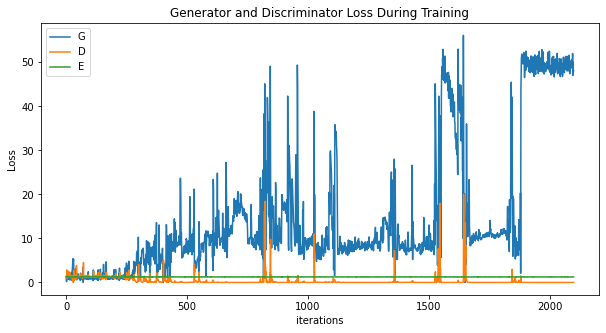

In [13]:
plot_train_loss()

---

# Test Data

In [14]:
#test_data_root = "../../dataset/test/test_DualPhaseSteel"
CFRP_test_data_root = "../../dataset/test/test_CFRP"

test_data_set = dataset.ImageFolder(root = CFRP_test_data_root, # test_data_root,
                           transform = transforms.Compose([
                                  transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

# 배치로 나누고 셔플하기
test_data_loader = torch.utils.data.DataLoader(test_data_set, batch_size = 1,
                                              shuffle = False, num_workers = workers)

# 이상 픽셀 수 확인 함수

In [15]:
def count_el_not_0(diff_img):
    count_el_not_0 = 0
    
    col_size = diff_img.shape[0]
    row_size = diff_img.shape[1]
    
    #print(col_size, row_size)
    
    for col in range(col_size):
        for row in range(row_size):
            if diff_img[col][row] != 0:
                count_el_not_0 += 1
                
    return count_el_not_0

# img 비교 함수

In [16]:
def compare_imgs(real_img, generated_img, i, score, reverse=False, threshold=50):
    real_img = real_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    generated_img = generated_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    
    negative = np.zeros_like(real_img)

    if not reverse:
        diff_img = real_img - generated_img
    else:
        diff_img = generated_img - real_img

    diff_img[diff_img <= threshold] = 0

    # 분율 추출
    diff_cnts.append(count_el_not_0(diff_img))
    # 분산 추출
    diff_points.append(np.where(diff_img > threshold))
    
    anomaly_img = np.zeros(shape=(img_size, img_size, 3))
    anomaly_img[:, :, 0] = real_img - diff_img
    anomaly_img[:, :, 1] = real_img - diff_img
    anomaly_img[:, :, 2] = real_img - diff_img
    anomaly_img[:, :, 0] = anomaly_img[:,:,0] + diff_img
    anomaly_img = anomaly_img.astype(np.uint8)

    # anomaly_img 추출
    anomaly_imgs.append(anomaly_img)
    
    fig, plots = plt.subplots(1, 4)

    fig.suptitle(f'Anomaly - (anomaly score: {score:.4})')
    
    fig.set_figwidth(9)
    fig.set_tight_layout(True)
    plots = plots.reshape(-1)
    plots[0].imshow(real_img, cmap='gray', label = "real")
    plots[1].imshow(generated_img, cmap='gray')
    plots[2].imshow(diff_img, cmap='gray')
    plots[3].imshow(anomaly_img)
    
    plots[0].set_title('real')
    plots[1].set_title('generated')
    plots[2].set_title('difference')
    plots[3].set_title('Anomaly Detection')
    plt.show()

# Test

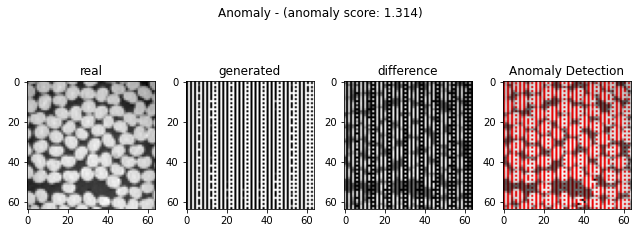

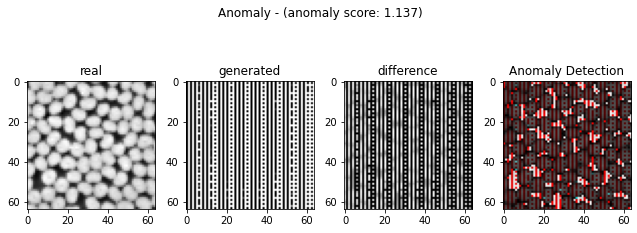

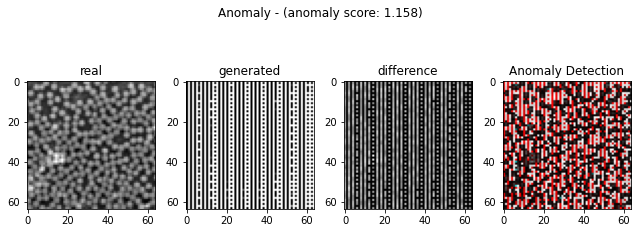

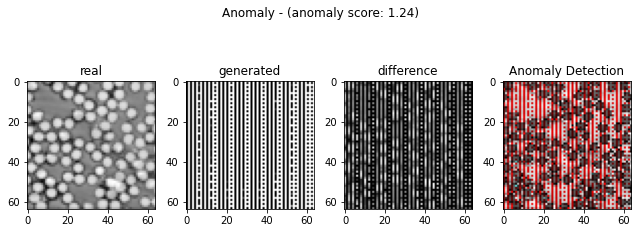

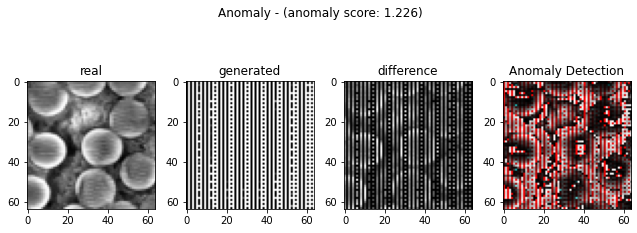

...

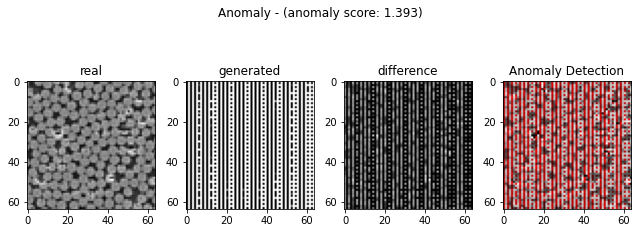

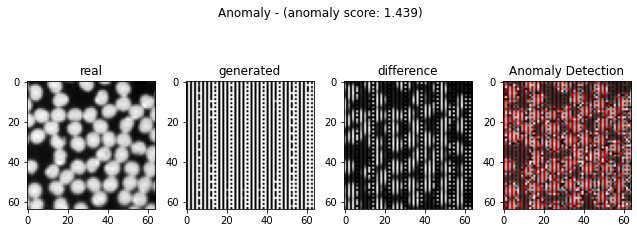

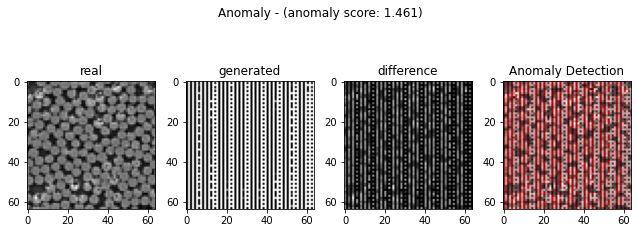

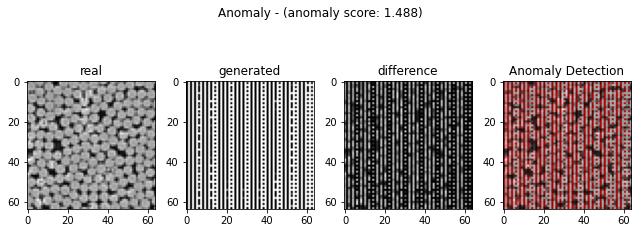

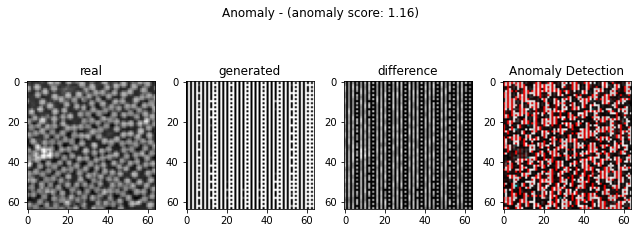

In [17]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

ano_criterion = nn.MSELoss()
DC.eval()
D.eval()
EC.eval()

# with open("score.csv", "w") as f:
#         f.write("label,img_distance,anomaly_score,z_distance\n")

for i, data in enumerate(test_data_loader, 0):
    real_img = data[0].to(device)

    real_z = EC(real_img) # 진짜 이미지의 latent vector
    fake_img = DC(real_z) # DC에 넣어서 가짜 이미지 생성.
    fake_z = EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

    _, real_feature = D.forward(real_img) # 1, 256
    _, fake_feature = D.forward(fake_img)

    img_distance = ano_criterion(fake_img, real_img)
    loss_feature = ano_criterion(fake_feature, real_feature)

    anomaly_score = img_distance + kappa*loss_feature

    z_distance = ano_criterion(fake_z, real_z)
    
#     with open("score.csv", "a") as f:
#             f.write(f"{label.item()},{img_distance},"
#                     f"{anomaly_score},{z_distance}\n")
            
#     print(f"{label.item()}, {img_distance}, "
#           f"{anomaly_score}, {z_distance}\n")
    compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

---

# 분율 추출

In [18]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.42602539 0.42797852 0.42651367 0.42724609 0.42773438 0.42602539
 0.42700195 0.42724609 0.42675781 0.42700195 0.42553711 0.42553711
 0.42651367 0.42724609 0.42773438 0.42480469 0.42651367 0.42651367
 0.42504883 0.42675781 0.42553711 0.42480469 0.42724609 0.42529297
 0.42749023 0.42626953 0.42773438 0.42724609 0.42700195 0.42504883
 0.42724609 0.42651367 0.42773438 0.42651367 0.4284668  0.42675781
 0.42749023 0.42529297 0.42626953 0.42602539 0.42456055 0.42749023
 0.42553711 0.42529297 0.42602539 0.42822266 0.42504883 0.42724609
 0.42553711 0.42675781 0.4284668  0.42480469 0.4230957  0.42651367
 0.42797852 0.42480469 0.42529297 0.42456055 0.42407227 0.42700195]


In [19]:
sum(diff_fraction)/len(diff_fraction)

0.4263671875

---

# 분산 추출

In [20]:
from scipy import stats
from extended_int import int_inf

corr_coeffis = []
corr_p_vals = []

def cal_corr_coeffis():
    for idx in range(len(test_data_loader)):
        x_points = diff_points[idx][0]
        y_points = diff_points[idx][1]
        
        
        if len(x_points) > 0:
            corr_coeffi, corr_p_val = stats.pearsonr(x_points, y_points)
        else:
            corr_coeffi, corr_p_val = -int_inf, -int_inf
        
        corr_coeffis.append(corr_coeffi)
        corr_p_vals.append(corr_p_val)

In [21]:
cal_corr_coeffis()

print(corr_coeffis)

[-0.001072523448644988, 0.0016686571103656212, -0.0009866308935211534, 0.0006025837039612238, 8.960479685061898e-05, 0.0009856894140049671, -0.002103615665304202, -0.0018645932086987275, 0.0008511932236504862, 0.00044217637756622033, -0.001502224460470587, -0.0017676285488705465, -0.0023145177562757524, -0.0009424683144654087, -0.002124553602559816, -0.0013112422430194125, 0.00012782775954897152, -0.0009866308935211534, 0.0013873095338207521, -1.4878836253533721e-05, -0.002141960971953462, -0.0002426060390788541, -0.0009476612220654414, -0.00392611427324467, 0.0007012770364744451, -0.0018805679525967659, -0.0010135525787202462, 0.0017159509681761126, 0.0014750758060278566, -9.33175136079694e-05, 5.115510633285983e-05, 0.00012782775954897152, 0.0003985346812138465, 0.0004908807323550828, -0.0013325575893789968, -0.00024543085420164305, -0.0022700383858315874, -0.0017006938031545122, -0.006665768973550009, -0.0030545468554455503, -0.0023713515672179157, -0.000210192233132225, 2.728756568

---

# 모델 저장 및 읽기

In [22]:
save_file = "./pretrained/pretrained.pth"

def save_pretrained():
    pretrained = {
        "D" : D.state_dict(),
        "DC" : DC.state_dict(),
        "EC" : EC.state_dict()
    }

    if not os.path.isdir("pretrained"):
        os.mkdir("pretrained")
    torch.save(pretrained, save_file)

In [23]:
save_pretrained()

In [24]:
pretrained_D = Discriminator().to(device)
pretrained_DC = Decoder().to(device)
pretrained_EC = Encoder().to(device)

def load_pretrained():
    global pretrained_D
    global pretrained_DC
    global pretrained_EC
    
    assert os.path.isdir("pretrained"), "Error : no pretrained dir found!"
    
    pretrained = torch.load(save_file)
    
    pretrained_D.load_state_dict(pretrained["D"])
    pretrained_DC.load_state_dict(pretrained["DC"])
    pretrained_EC.load_state_dict(pretrained["EC"])
    
    #print("pretrained_D :", pretrained_D)
    #print("pretrained_G :", pretrained_DC)
    #print("pretrained_E :", pretrained_EC)

In [25]:
load_pretrained()

In [26]:
def test():
    ano_criterion = nn.MSELoss()
    pretrained_DC.eval()
    pretrained_D.eval()
    pretrained_EC.eval()

    # with open("score.csv", "w") as f:
    #         f.write("label,img_distance,anomaly_score,z_distance\n")

    for i, data in enumerate(test_data_loader, 0):
        real_img = data[0].to(device)

        real_z = pretrained_EC(real_img) # 진짜 이미지의 latent vector
        fake_img = pretrained_DC(real_z) # DC에 넣어서 가짜 이미지 생성.
        fake_z = pretrained_EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

        _, real_feature = pretrained_D.forward(real_img) # 1, 256
        _, fake_feature = pretrained_D.forward(fake_img)

        img_distance = ano_criterion(fake_img, real_img)
        loss_feature = ano_criterion(fake_feature, real_feature)

        anomaly_score = img_distance + kappa*loss_feature

        z_distance = ano_criterion(fake_z, real_z)

    #     with open("score.csv", "a") as f:
    #             f.write(f"{label.item()},{img_distance},"
    #                     f"{anomaly_score},{z_distance}\n")

    #     print(f"{label.item()}, {img_distance}, "
    #           f"{anomaly_score}, {z_distance}\n")
        compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

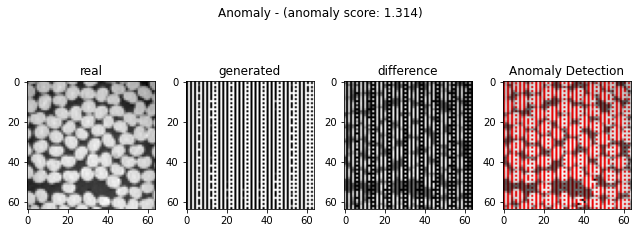

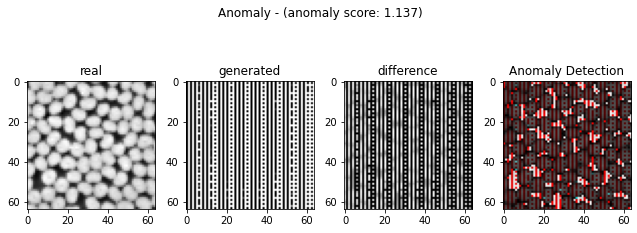

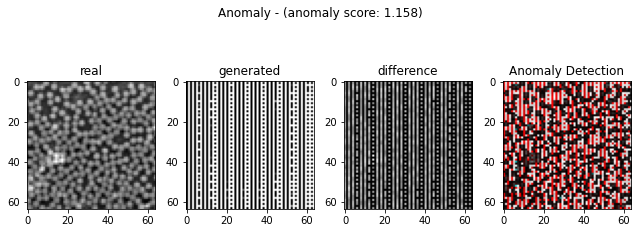

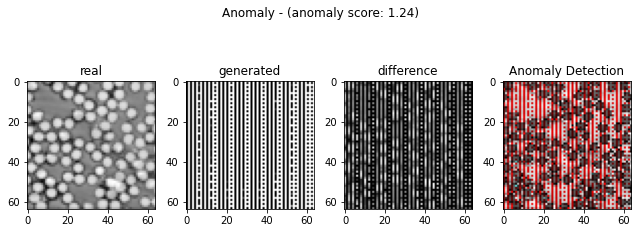

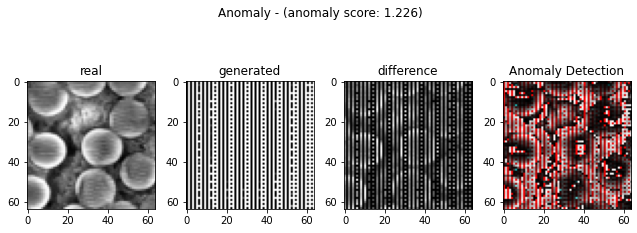

...

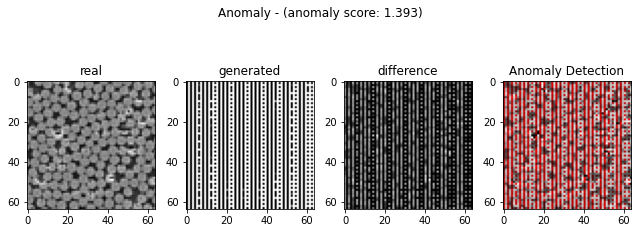

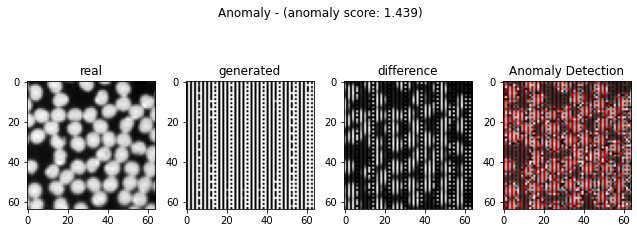

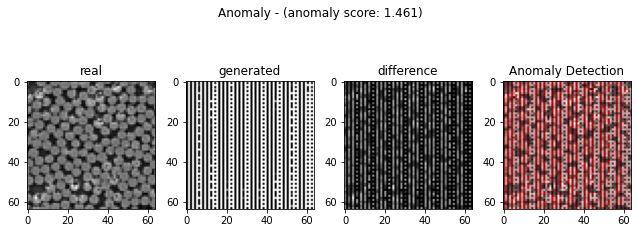

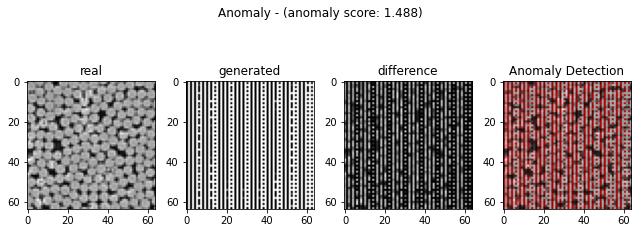

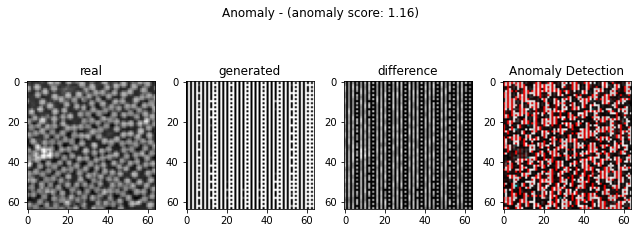

In [27]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

corr_coeffis = []
corr_p_vals = []

test()

In [28]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.42602539 0.42797852 0.42651367 0.42724609 0.42773438 0.42602539
 0.42700195 0.42724609 0.42675781 0.42700195 0.42553711 0.42553711
 0.42651367 0.42724609 0.42773438 0.42480469 0.42651367 0.42651367
 0.42504883 0.42675781 0.42553711 0.42480469 0.42724609 0.42529297
 0.42749023 0.42626953 0.42773438 0.42724609 0.42700195 0.42504883
 0.42724609 0.42651367 0.42773438 0.42651367 0.4284668  0.42675781
 0.42749023 0.42529297 0.42626953 0.42602539 0.42456055 0.42749023
 0.42553711 0.42529297 0.42602539 0.42822266 0.42504883 0.42724609
 0.42553711 0.42675781 0.4284668  0.42480469 0.4230957  0.42651367
 0.42797852 0.42480469 0.42529297 0.42456055 0.42407227 0.42700195]


In [29]:
cal_corr_coeffis()

print(corr_coeffis)

[-0.001072523448644988, 0.0016686571103656212, -0.0009866308935211534, 0.0006025837039612238, 8.960479685061898e-05, 0.0009856894140049671, -0.002103615665304202, -0.0018645932086987275, 0.0008511932236504862, 0.00044217637756622033, -0.001502224460470587, -0.0017676285488705465, -0.0023145177562757524, -0.0009424683144654087, -0.002124553602559816, -0.0013112422430194125, 0.00012782775954897152, -0.0009866308935211534, 0.0013873095338207521, -1.4878836253533721e-05, -0.002141960971953462, -0.0002426060390788541, -0.0009476612220654414, -0.00392611427324467, 0.0007012770364744451, -0.0018805679525967659, -0.0010135525787202462, 0.0017159509681761126, 0.0014750758060278566, -9.33175136079694e-05, 5.115510633285983e-05, 0.00012782775954897152, 0.0003985346812138465, 0.0004908807323550828, -0.0013325575893789968, -0.00024543085420164305, -0.0022700383858315874, -0.0017006938031545122, -0.006665768973550009, -0.0030545468554455503, -0.0023713515672179157, -0.000210192233132225, 2.728756568

---

# anomaly detection 이미지 추출

In [30]:
anomaly_imgs

[array([[[187,   1,   1],
         [192, 192, 192],
         [193,   1,   1],
         ...,
         [180, 180, 180],
         [186, 186, 186],
         [186, 186, 186]],
 
        [[135,   1,   1],
         [180, 180, 180],
         [181,   1,   1],
         ...,
         [190, 190, 190],
         [183,   1,   1],
         [188, 188, 188]],
 
        [[185,   1,   1],
         [180, 180, 180],
         [127,   1,   1],
         ...,
         [188, 188, 188],
         [184, 184, 184],
         [190, 190, 190]],
 
        ...,
 
        [[179,   1,   1],
         [206, 206, 206],
         [205,   1,   1],
         ...,
         [226, 226, 226],
         [231,   1,   1],
         [150, 150, 150]],
 
        [[171,   1,   1],
         [113, 113, 113],
         [197,   1,   1],
         ...,
         [228, 228, 228],
         [218, 218, 218],
         [166, 166, 166]],
 
        [[187,   2,   2],
         [166, 166, 166],
         [221,   2,   2],
         ...,
         [226, 226, 226],
  

# 이미지 저장 함수

In [31]:
import cv2

def save_imgs(folder, imgs):
    if not os.path.isdir("anomaly_imgs"):
        os.mkdir("anomaly_imgs")
    
    for i in range(len(imgs)):
        cv2.imwrite('%s/%d.png' %(folder,i), imgs[i]) #이미지 저장할 경로 설정을 여기서 한다.
    print("image saving complete")

In [32]:
save_imgs("./anomaly_imgs", anomaly_imgs)

image saving complete


---

# 티타늄(Ti64) 상대 밀도 계산

In [33]:
Ti64_density = 4.43

Ti64_rel_densitys = np.array([])

Ti64_rel_densitys = diff_fraction * Ti64_density

print(Ti64_rel_densitys)

[1.88729248 1.89594482 1.88945557 1.8927002  1.89486328 1.88729248
 1.89161865 1.8927002  1.89053711 1.89161865 1.88512939 1.88512939
 1.88945557 1.8927002  1.89486328 1.88188477 1.88945557 1.88945557
 1.88296631 1.89053711 1.88512939 1.88188477 1.8927002  1.88404785
 1.89378174 1.88837402 1.89486328 1.8927002  1.89161865 1.88296631
 1.8927002  1.88945557 1.89486328 1.88945557 1.89810791 1.89053711
 1.89378174 1.88404785 1.88837402 1.88729248 1.88080322 1.89378174
 1.88512939 1.88404785 1.88729248 1.89702637 1.88296631 1.8927002
 1.88512939 1.89053711 1.89810791 1.88188477 1.87431396 1.88945557
 1.89594482 1.88188477 1.88404785 1.88080322 1.87864014 1.89161865]
